# PW 1 - Markovian models  
Sampling of Markovian models.

The aim of this session is to program the Gibbs sampler algorithm and study it in the binary case.

In this section we consider a binary Markov random field (taking values in $E=\{0,1\}$).
The neighborhood is defined in 4-connexity and the potential of a clique of order 2 is defined by :
$U_c(0,1)=U_c(1,0)=+\beta$ and $U_c(1,1)=U_c(0,0)=0$ (the potential for singleton clique is 0).


In [6]:
import math
import random
import numpy as np
import platform
import tempfile
import os
import matplotlib.pyplot as plt
import imageio
from scipy import ndimage as ndi

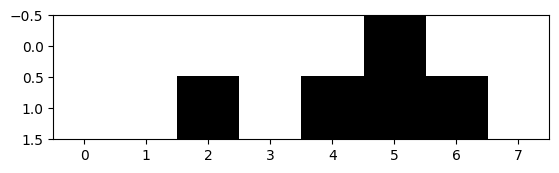

In [14]:
plt.set_cmap('gray')

sh=[2,8]

imaU=2-np.ceil(2*np.random.rand(*sh))
plt.imshow(imaU)

### Q1
For the Ising model defined above, and the imaU generated in the previous cell, give the formula of the global energy and give its value as a function of $\beta$ for imaU.



### A1

$$U(x) = \sum_{c \in C / c=\{s,t\}} V_c(x_s,x_t) $$

So we get $U(x) = 9 \beta$ (in the written paper i have a different image so a different result )


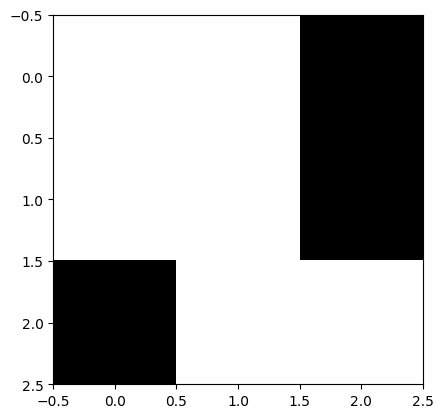

In [10]:
plt.set_cmap('gray')

sh=[3,3]

imaVois=2-np.ceil(2*np.random.rand(*sh))
plt.imshow(imaVois)

### Q2

Write the general form of the local conditional probability in a pixel $s$. For the neighborhood configuration imaVois generated by the previous code cell, compute the 2 local conditional energies (for the value 0 and for the value 1 of the central pixel), then the local conditional probabilities (as a function of $\beta$). What is the most probable class ? (NB: do the calculation for an 8-neighborhood).


### A2

$$
\mathbb{P}(X_s=x_s|V_s) = \frac 1 {Z^s} exp(-U_s(x_s,V_s)) \\
\text{where} \quad U_s(x_s,V_s) = \sum_{c\subset C, s \in c} V_c(x_s,V_s) \quad\text{and}\quad Z^s \quad\text{is a normalizing factor}
$$

In the example above this markdown ( which is different from the one in the paper ) we have :
$$ 
U_s(0|1,1,0,0,1,1,0,1) = 3 V_c(0,0) + 5 V_c(0,1) = 5 \beta \\
U_s(1|1,1,0,0,1,1,0,1) = 3 V_c(1,0) + 5 V_c(1,1) = 3 \beta 
$$
So 
$$
\mathbb{P}(X_s=0|V_s) = \frac{e^{-5\beta}}{Z^s} \quad\text{and}\quad \mathbb{P}(X_s=1|V_s) = \frac{e^{-3\beta}}{Z^s} \\

\mathbb{P}(X_s=0|V_s) + \mathbb{P}(X_s=1|V_s) = 1 \implies Z^s = e^{-5\beta} + e^{-3\beta}
$$

## Part 1

Programming the Gibbs sampler and drawing samples of Markovian models



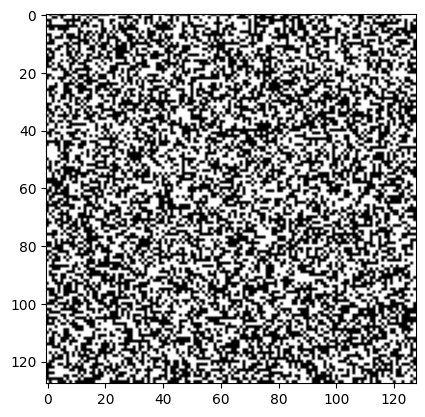

In [4]:
plt.set_cmap('gray')

sh=[128,128]

im_bin=2-np.ceil(2*np.random.rand(*sh))
plt.imshow(im_bin)

### Sampling function
Complete the following function which takes as input a binary image (which will be updated by Gibbs sampling) and the value of the regularization parameter.


In [12]:
def echan(im_bin,beta_reg):

    i=0
    j=0

    for i in range(im_bin.shape[0]):
        for j in range(im_bin.shape[1]):
          # do not change these indices
          # they allow access to neighboring pixels
          # i1,j and i2,j and i,j1 and i,j2
            i1=(i-1)%im_bin.shape[0]
            i2=(i+1)%im_bin.shape[0]
            j1=(j-1)%im_bin.shape[1]
            j2=(j+1)%im_bin.shape[1]

        # complete the calculation of energies and associated probabilities
        # energy and non-normalized proba when the pixel is put in class 0
            Ureg0= np.sum([im_bin[i1,j],im_bin[i2,j],im_bin[i,j1],im_bin[i,j2]])*beta_reg
            p0=math.exp(-Ureg0)

        # energy and non-normalized proba when the pixel is put in class 1
            Ureg1= (4-np.sum([im_bin[i1,j],im_bin[i2,j],im_bin[i,j1],im_bin[i,j2]]))*beta_reg
            p1=math.exp(-Ureg1)

        # sampling according to the normalized probabilities. NB: the normalization is done here
            if (p0+p1!=0.):
                if(random.uniform(0,1)<p0/(p0+p1)):
                    im_bin[i,j]= 0
                else :
                    im_bin[i,j]= 1

    return im_bin


By varying the value of the regularization parameter and restarting the cell, observe. You can remove the visualization during sampling and increase the number of iterations

<Figure size 640x480 with 0 Axes>

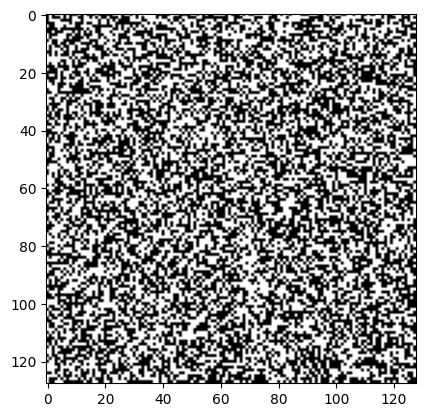

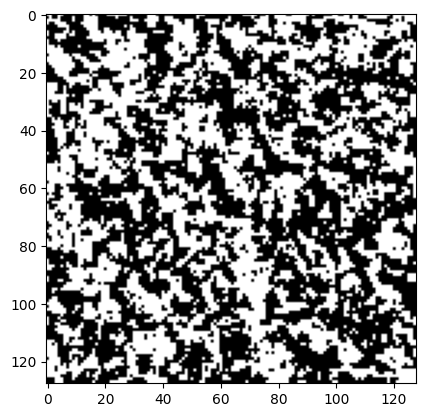

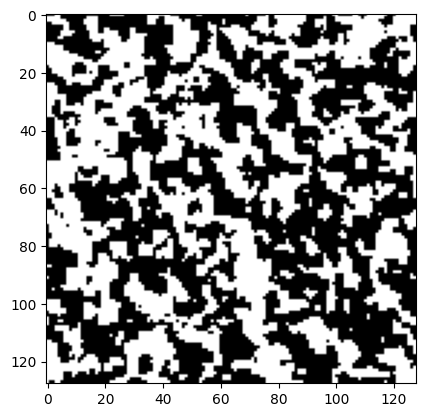

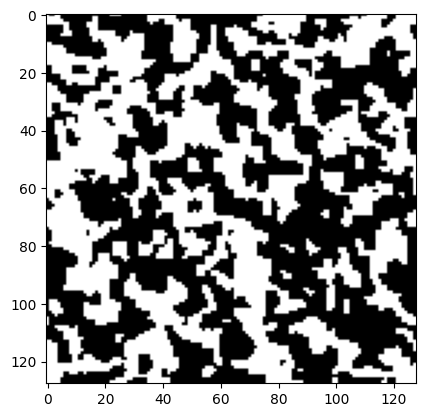

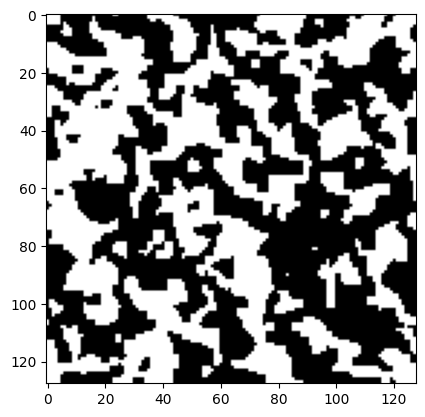

...

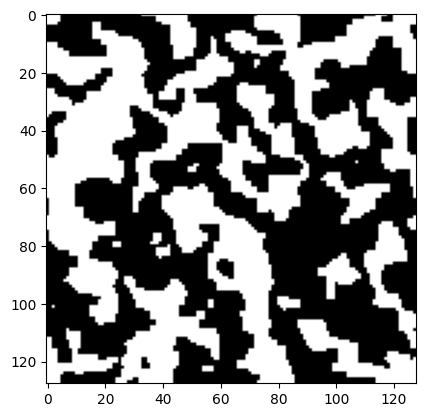

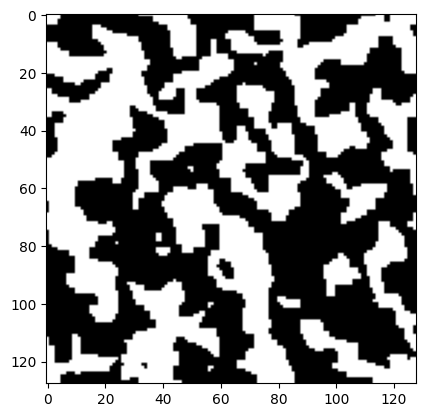

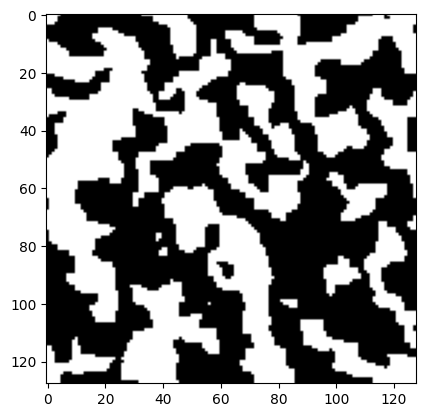

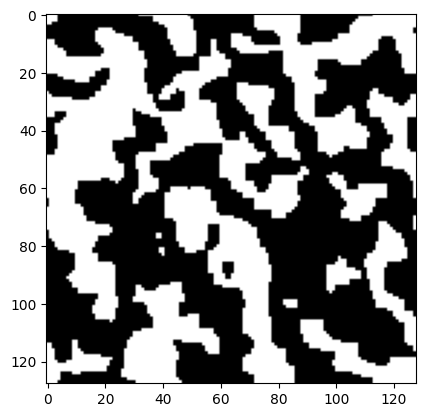

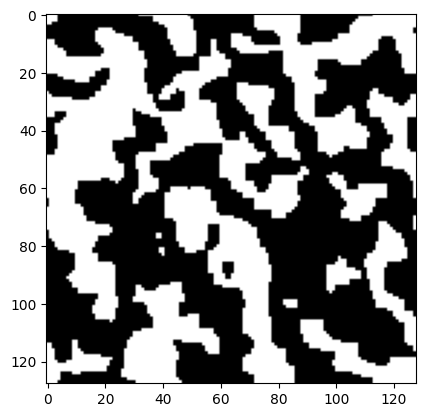

In [13]:

# random initialization of im_bin
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
#plt.imshow(im_bin)

beta_reg= 20

mafigure=plt.figure()
plt.imshow(im_bin)
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echan(im_bin,beta_reg)
    plt.imshow(im_bin)
    mafigure.canvas.draw()
    plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.show()

<Figure size 640x480 with 0 Axes>

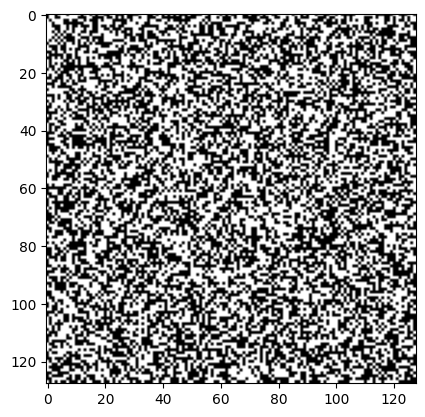

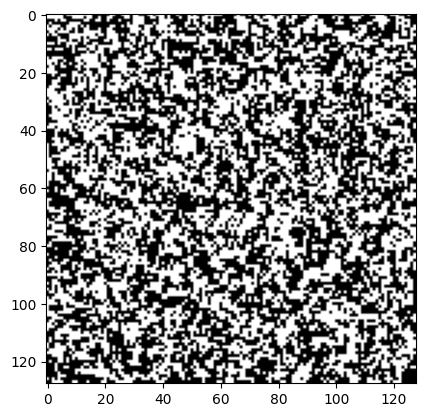

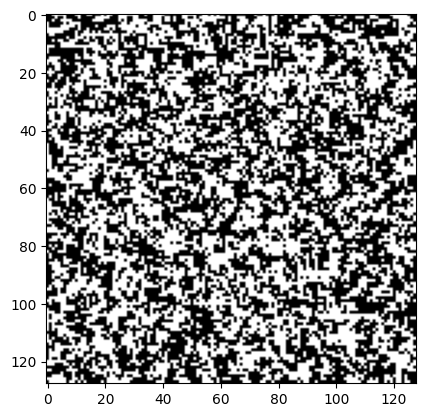

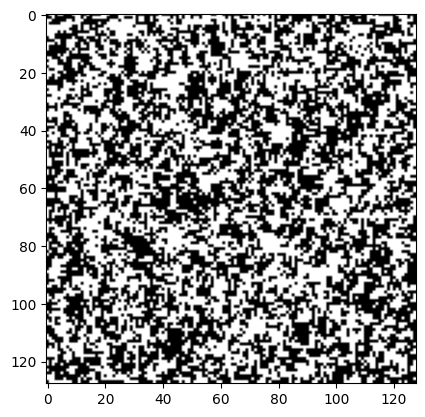

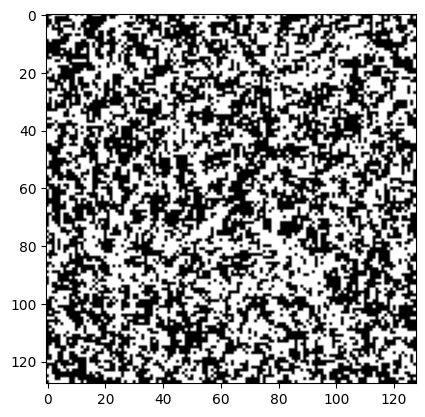

...

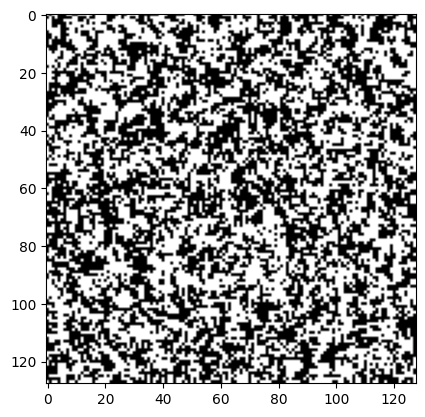

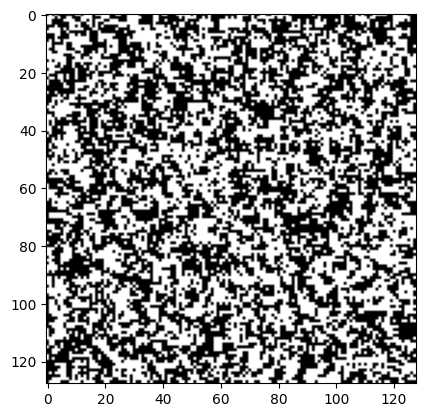

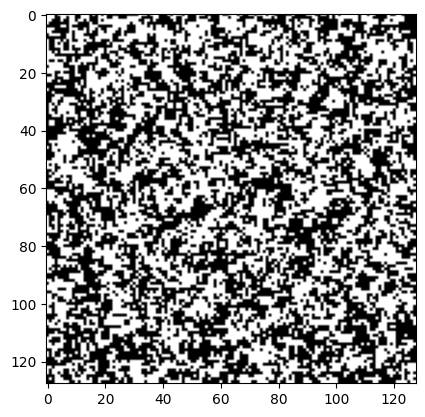

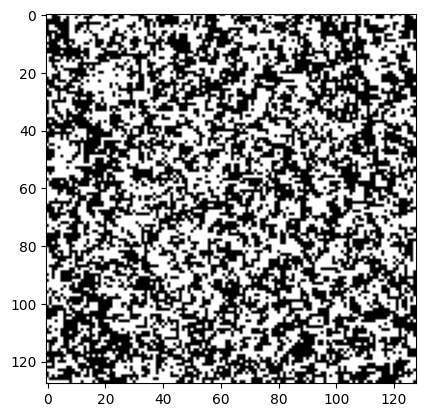

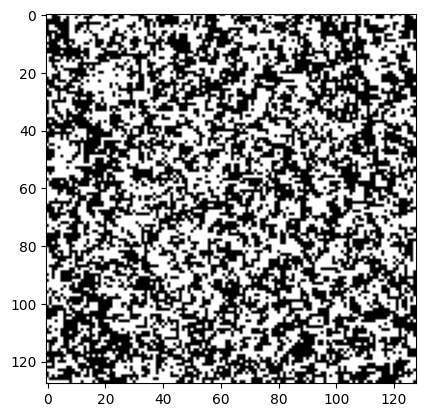

In [7]:

# random initialization of im_bin
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
#plt.imshow(im_bin)

beta_reg= 0.5

mafigure=plt.figure()
plt.imshow(im_bin)
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echan(im_bin,beta_reg)
    plt.imshow(im_bin)
    mafigure.canvas.draw()
    plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.show()

<Figure size 640x480 with 0 Axes>

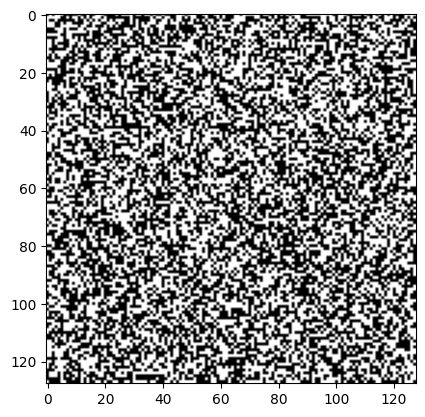

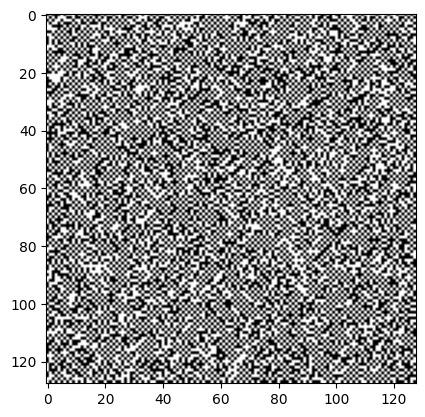

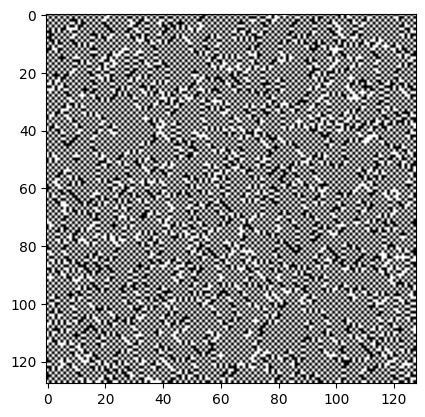

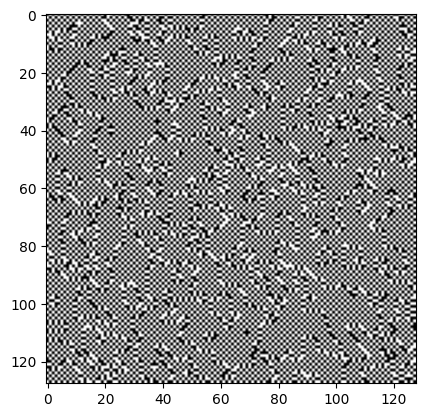

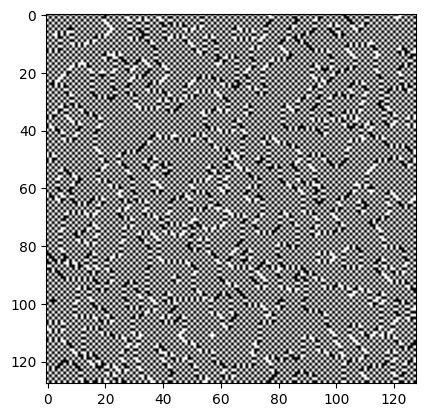

...

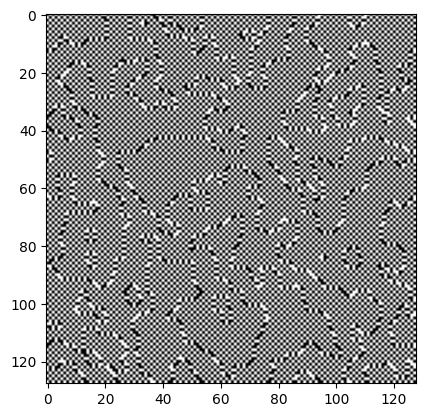

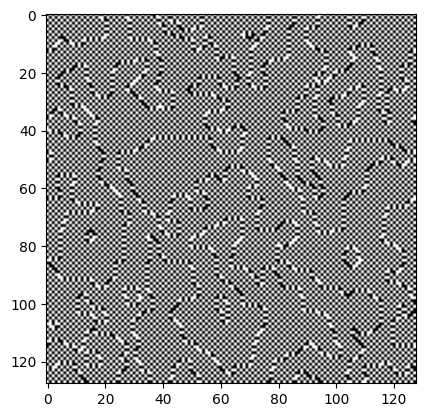

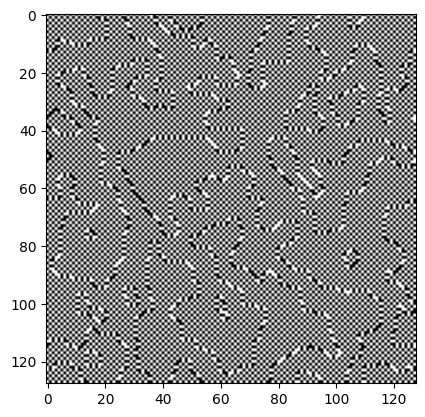

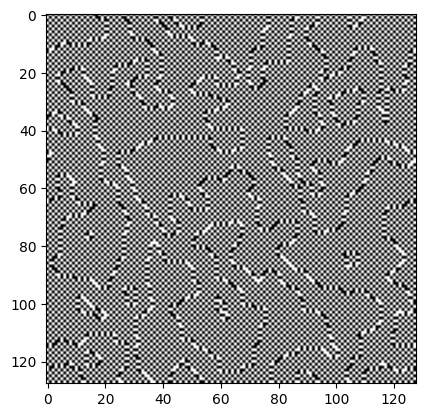

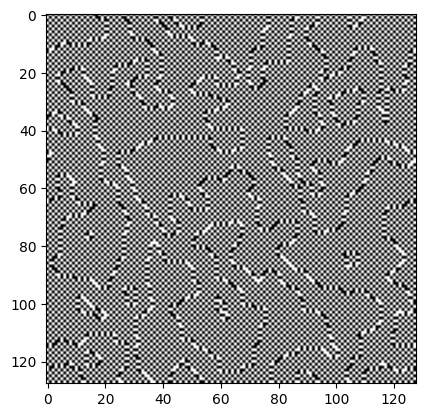

In [8]:

# random initialization of im_bin
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
#plt.imshow(im_bin)

beta_reg= -10

mafigure=plt.figure()
plt.imshow(im_bin)
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echan(im_bin,beta_reg)
    plt.imshow(im_bin)
    mafigure.canvas.draw()
    plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.show()

### Q3
Run the program several times. Do you still get the same image? Comment on this.

### A3

No, we don't get the same image because we have two sources of randomness which are the initialization of the image and the modification of the pixels according random draws following the law defined in the code of the function echan.

### Q4

Vary $\beta$ from 0.5 to 20. Comment on the results.

### A4

We can see that when $\beta$ is small the result image doesn't change significantly from the initial image so we still have an image where there is so many transitions in color (white or black) from pixel to it's neighboor. When $\beta$ gets bigger, we can see that the result image is very diffirent from the input image and we have a more regular image in terms of black and white pixels.

### Q5
Which image minimizes the overall energy for this model?

### A5

With this model of potential, the image that minimizes the overall energy is an image all white or all black, the energy in these two cases is zero.

### Q6
Change 𝛽 and give it a negative value. Describe the result and justify it.

### A6

When we have a negative beta, we observe that the image tends toward an almost perfect alternation of black and white pixels. Indeed, this is equivalent to removing the "-" in the exponent of the probabilities, thus inverting the dynamics of the probability density. As a result, we will only make changes that increase the energy of the image.

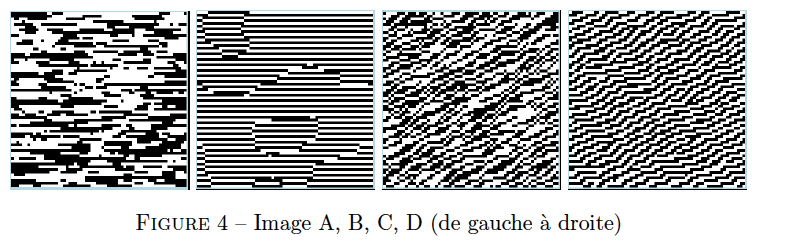

### Q7
We now work in 8-neighborhood, but still with cliques of order 2 (non-isotropic this time). For each of the following images, propose the clique potentials that allow us to obtain these realizations. Initially all clique potentials are zero.


* Image A : there is only one clique potential of order 2 which is -1.
* Image B : in addition to the previous one, there is a clique potential of order 2 which is 1. Indicate which one.
* Image C: in addition to the 2 previous ones, there is a clique potential of order 2 which is -1. Indicate which one.
* Image D: in addition to the 3 previous ones, there is a second order clique potential which is +1. Indicate which one.





### A7

* Image A : the considered clique is the one that has the right or the left pixels, and the potential is equal to -1 if they are equal.
* Image B : in addition to the previous one, we consider the pixels of the top and the bottom and the potential is equal to 1 if they are equal in order to regulize the image.
* Image C: we see that we have some diagonal lines, so we consider the pixels of the diagonal of $\pi/4$ direction, and the potential is equal to -1 if they are equal.
* Image D: just like image B, we consider the pixels of the top and the bottom and the potential is equal to 1 if they are equal to regulize the image.

### Q8

Modify your program to define an Ising model with a diagonal attractive potential only (the other potentials are zero). It means that this model **encourages** similar labels (either 0 or 1) for neighboring pixels in the diagonal directions ($\pi/4$ or $3\pi/4$ directions). Comment on the result.

### A8

In [24]:
def echan1(im_bin,beta_reg):

    i=0
    j=0

    for i in range(im_bin.shape[0]):
        for j in range(im_bin.shape[1]):
          # do not change these indices
          # they allow access to neighboring pixels
          # i1,j and i2,j and i,j1 and i,j2
            i1=(i-1)%im_bin.shape[0]
            i2=(i+1)%im_bin.shape[0]
            j1=(j-1)%im_bin.shape[1]
            j2=(j+1)%im_bin.shape[1]

        # complete the calculation of energies and associated probabilities
        # energy and non-normalized proba when the pixel is put in class 0
            Ureg0= (im_bin[i1,j1]+im_bin[i2,j2])*beta_reg
            p0=math.exp(-Ureg0)

        # energy and non-normalized proba when the pixel is put in class 1
            Ureg1= (2-im_bin[i1,j1]-im_bin[i2,j2])*beta_reg
            p1=math.exp(-Ureg1)

        # sampling according to the normalized probabilities. NB: the normalization is done here
            if (p0+p1!=0.):
                if(random.uniform(0,1)<p0/(p0+p1)):
                    im_bin[i,j]= 0
                else :
                    im_bin[i,j]= 1

    return im_bin

def echan2(im_bin,beta_reg):

    i=0
    j=0

    for i in range(im_bin.shape[0]):
        for j in range(im_bin.shape[1]):
          # do not change these indices
          # they allow access to neighboring pixels
          # i1,j and i2,j and i,j1 and i,j2
            i1=(i-1)%im_bin.shape[0]
            i2=(i+1)%im_bin.shape[0]
            j1=(j-1)%im_bin.shape[1]
            j2=(j+1)%im_bin.shape[1]

        # complete the calculation of energies and associated probabilities
        # energy and non-normalized proba when the pixel is put in class 0
            Ureg0= (im_bin[i1,j2]+im_bin[i2,j1])*beta_reg
            p0=math.exp(-Ureg0)

        # energy and non-normalized proba when the pixel is put in class 1
            Ureg1= (2-im_bin[i1,j2]-im_bin[i2,j1])*beta_reg
            p1=math.exp(-Ureg1)

        # sampling according to the normalized probabilities. NB: the normalization is done here
            if (p0+p1!=0.):
                if(random.uniform(0,1)<p0/(p0+p1)):
                    im_bin[i,j]= 0
                else :
                    im_bin[i,j]= 1

    return im_bin

<Figure size 640x480 with 0 Axes>

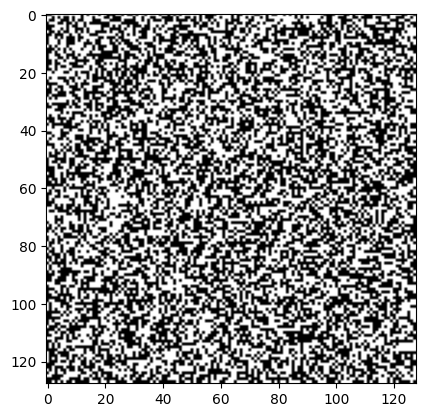

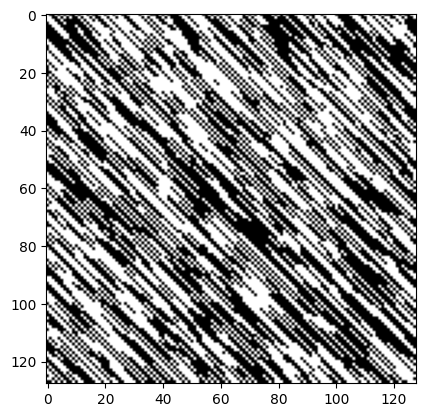

In [25]:
# random initialization of im_bin
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
#plt.imshow(im_bin)

beta_reg= 10

mafigure=plt.figure()
plt.imshow(im_bin)
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echan1(im_bin,beta_reg)

plt.figure()
plt.imshow(im_bin)
plt.show()

<Figure size 640x480 with 0 Axes>

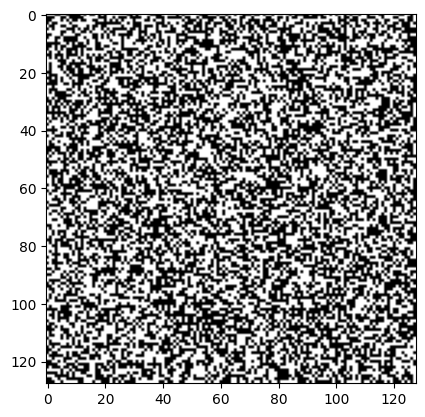

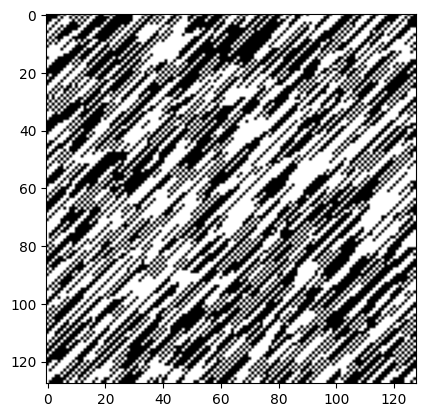

In [26]:
# random initialization of im_bin
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
#plt.imshow(im_bin)

beta_reg= 10

mafigure=plt.figure()
plt.imshow(im_bin)
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echan2(im_bin,beta_reg)

plt.figure()
plt.imshow(im_bin)
plt.show()


We can see that we have indeed regularized the image along the chosen diagonal ($\pi/4$ or $3\pi/4$ directions).